# Linking Vehicle Ownership Data to Food Locations

Maps by Christopher Do

Our project is researching the food access environment in Washington D.C. Our 

For this midterm, I want to create a map that visualizes food access in Washington, D.C using Open Data on grocery stores, healthy corner stores, and farmers markets. Then, I want to take Census ACS data to map vehicle ownership disparities across Washington, D.C. Finally, I will overlay the map of grocery stores, healthy corner stores, and farmers markets and overlay it onto vehicle ownership.

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx
import plotly.express as px

# Cleaning up the Food Data

I want to bring in the food data first. I will start by cleaning up the data, keeping store names and adding store types, as well as the geometry and location of stores.

In [2]:
grocery = pd.read_csv('data/Grocery_Store_Locations.csv')

In [3]:
# To figure out columns and what is included in data
grocery.shape

(82, 36)

In [4]:
# To see what columns/data are included
grocery.head()

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,...,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,...,397662.57,146280.07,300512,NaN,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
1,-77.026066,38.983464,International Progresso Market,7719 GEORGIA AVENUE NW,20012,2025455015,Ward 4,2961 0810,NaN,NaN,...,397741.80,146169.97,285417,NaN,{2C18863D-40DE-4F66-AA59-46F1C65D67F2},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
2,-77.027798,38.967771,Jocelyn’s Market,6404 GEORGIA AVENUE NW,20012,2027227574,Ward 4,2945 0839,NaN,NaN,...,397591.16,144428.00,285334,NaN,{A0B448C3-B3FB-49FE-B8BF-1FEBA3CEA642},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
3,-77.076459,38.965553,Magruder's,5626 CONNECTICUT AVENUE NW,20015,2024644946,Ward 3,1860 0013,,Yes,...,393373.92,144184.19,263860,NaN,{9ABE1C46-BB48-4110-B5BA-C6363CA3BD7A},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
4,-77.074910,38.964601,Safeway,5545 CONNECTICUT AVENUE NW,20015,2022446097,Ward 3,1867 0092,,No,...,393508.13,144078.34,263999,NaN,{902F540E-FE16-43A5-8010-CD84E94B28B7},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


In [5]:
# I want to see all columns displayed so I don't miss anything
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [6]:
grocery.head()

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,PRESENT95,PRESENT00,PRESENT05,PRESENT08,PRESENT09,PRESENT10,PRESENT11,PRESENT12,PRESENT13,PRESENT14,PRESENT15,PRESENT16,PRESENT17,PRESENT18,GIS_ID,OBJECTID,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GroceryStorePt_1,641,397662.57,146280.07,300512,NaN,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
1,-77.026066,38.983464,International Progresso Market,7719 GEORGIA AVENUE NW,20012,2025455015,Ward 4,2961 0810,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GroceryStorePt_2,642,397741.80,146169.97,285417,NaN,{2C18863D-40DE-4F66-AA59-46F1C65D67F2},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
2,-77.027798,38.967771,Jocelyn’s Market,6404 GEORGIA AVENUE NW,20012,2027227574,Ward 4,2945 0839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GroceryStorePt_3,643,397591.16,144428.00,285334,NaN,{A0B448C3-B3FB-49FE-B8BF-1FEBA3CEA642},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
3,-77.076459,38.965553,Magruder's,5626 CONNECTICUT AVENUE NW,20015,2024644946,Ward 3,1860 0013,,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,GroceryStorePt_4,644,393373.92,144184.19,263860,NaN,{9ABE1C46-BB48-4110-B5BA-C6363CA3BD7A},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
4,-77.074910,38.964601,Safeway,5545 CONNECTICUT AVENUE NW,20015,2022446097,Ward 3,1867 0092,,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,GroceryStorePt_5,645,393508.13,144078.34,263999,NaN,{902F540E-FE16-43A5-8010-CD84E94B28B7},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


In [7]:
# to see what type of information is in each column
grocery.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 82 non-null     float64
 1   Y                 82 non-null     float64
 2   STORENAME         82 non-null     object 
 3   ADDRESS           82 non-null     object 
 4   ZIPCODE           82 non-null     int64  
 5   PHONE             82 non-null     int64  
 6   WARD              82 non-null     object 
 7   SSL               82 non-null     object 
 8   NOTES             53 non-null     object 
 9   PRESENT90         55 non-null     object 
 10  PRESENT95         55 non-null     object 
 11  PRESENT00         55 non-null     object 
 12  PRESENT05         55 non-null     object 
 13  PRESENT08         55 non-null     object 
 14  PRESENT09         55 non-null     object 
 15  PRESENT10         55 non-null     object 
 16  PRESENT11         55 non-null     object 
 17 

I will add a new column, "Store Type" to help distinguish this data set from the healthy corner store and farmers market data.

In [8]:
grocery['STORE TYPE']= 'Grocery store' # create a new column "store type"

There are a lot of columns that I won't need so I will clean those up now.

In [9]:
#subsetting the data
desired_columns = ['X','Y','STORENAME','WARD', 'STORE TYPE']
grocery_trimmed = grocery[desired_columns].copy()
grocery_trimmed = grocery_trimmed.dropna()
grocery_trimmed.sample

<bound method NDFrame.sample of             X          Y                       STORENAME    WARD  \
0  -77.026981  38.984455                         Target   Ward 4   
1  -77.026066  38.983464  International Progresso Market  Ward 4   
2  -77.027798  38.967771               Jocelyn’s Market   Ward 4   
3  -77.076459  38.965553                      Magruder's  Ward 3   
4  -77.074910  38.964601                         Safeway  Ward 3   
5  -77.027285  38.962078             Walmart Supercenter  Ward 4   
6  -77.002144  38.957977             Walmart Supercenter  Ward 4   
7  -77.021318  38.956604   Tropimart International Foods  Ward 4   
8  -77.083861  38.956303                       Rodman’s   Ward 3   
9  -77.012301  38.951416                   Avenue Market  Ward 4   
10 -77.079215  38.949109                     Whole Foods  Ward 3   
11 -77.080552  38.948537                         Target   Ward 3   
12 -77.095759  38.945722               Wagshal’s Market   Ward 3   
13 -77.063173  3

In [10]:
#confirming that new variable looks good
grocery_trimmed.head()

,X,Y,STORENAME,WARD,STORE TYPE
0,-77.026981,38.984455,Target,Ward 4,Grocery store
1,-77.026066,38.983464,International Progresso Market,Ward 4,Grocery store
2,-77.027798,38.967771,Jocelyn’s Market,Ward 4,Grocery store
3,-77.076459,38.965553,Magruder's,Ward 3,Grocery store
4,-77.074910,38.964601,Safeway,Ward 3,Grocery store


# Healthy Corner Store Data

Now I want to bring in healthy corner store data and then clean it up.

In [11]:
healthy= pd.read_csv('data/Healthy_Corner_Stores.csv')

In [12]:
healthy.shape

(71, 17)

In [13]:
healthy.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          71 non-null     float64
 1   Y          71 non-null     float64
 2   OBJECTID   71 non-null     int64  
 3   STORE      71 non-null     object 
 4   ADDRESS    71 non-null     object 
 5   XCOORD     71 non-null     float64
 6   YCOORD     71 non-null     float64
 7   MATCHTYPE  71 non-null     object 
 8   MAR_ID     68 non-null     float64
 9   LATITUDE   68 non-null     float64
 10  LONGITUDE  68 non-null     float64
 11  GIS_ID     71 non-null     object 
 12  GLOBALID   71 non-null     object 
 13  CREATOR    0 non-null      float64
 14  CREATED    0 non-null      float64
 15  EDITOR     0 non-null      float64
 16  EDITED     0 non-null      float64
dtypes: float64(11), int64(1), object(5)
memory usage: 9.6+ KB


In [14]:
# I want to change 'STORE' to 'STORENAME' to keep everything aligned with the grocery data
healthy.rename(columns={'STORE':'STORENAME'}, inplace=True)
healthy.head()

,X,Y,OBJECTID,STORENAME,ADDRESS,XCOORD,YCOORD,MATCHTYPE,MAR_ID,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.019079,38.975046,1,BP Blaire Gas Station,7000 Blair Rd NW,398346.95,145235.41,Exact,249127.0,38.975039,-77.019077,HealthyCornerStorePt_1,{F6CD05AE-1648-404D-B7A3-603BE5E3361B},NaN,NaN,NaN,NaN
1,-77.028431,38.961525,2,Missouri Avenue Market,5900 Georgia Ave NW,397536.12,143734.68,Exact,253189.0,38.961518,-77.028429,HealthyCornerStorePt_2,{87C1AAA2-139C-4A8D-AA34-DF7A3AA1312C},NaN,NaN,NaN,NaN
2,-77.010355,38.956438,3,Capital View Convenience Store,12 Kennedy St NW,399102.65,143169.61,Exact,283923.0,38.956431,-77.010353,HealthyCornerStorePt_3,{77D178A5-1D12-492B-A96C-5D0FFC242C97},NaN,NaN,NaN,NaN
3,-77.027749,38.955825,4,S&G Liquor and Grocery,5421 Georgia Ave NW,397595.00,143101.81,Exact,254615.0,38.955817,-77.027747,HealthyCornerStorePt_4,{D8EB793F-418B-43A8-843B-DA0CFACA0832},NaN,NaN,NaN,NaN
4,-77.020196,38.955826,5,Starlight Food,5424 5th St NW,0.00,0.00,Manual,NaN,NaN,NaN,HealthyCornerStorePt_5,{1DA97531-D58F-4F82-9D9B-4071D1B7B361},NaN,NaN,NaN,NaN


Next, I want to add in a column that indicates that these locations are "Healthy Corner Stores" so when 
I merge the information with grocery stores and farmers markets, we will be able to distinguish between
the different types of food providers.

In [15]:
healthy['STORE TYPE']= 'Healthy Corner Store'

I will trim the data to only include coordinates, store name, and store type (note: ward information is not geocoded here)

In [16]:
desired_columns_healthy= ['X','Y','STORENAME','STORE TYPE']
healthy_trimmed = healthy[desired_columns_healthy].copy()
healthy_trimmed = healthy_trimmed.dropna()
healthy_trimmed.head()

,X,Y,STORENAME,STORE TYPE
0,-77.019079,38.975046,BP Blaire Gas Station,Healthy Corner Store
1,-77.028431,38.961525,Missouri Avenue Market,Healthy Corner Store
2,-77.010355,38.956438,Capital View Convenience Store,Healthy Corner Store
3,-77.027749,38.955825,S&G Liquor and Grocery,Healthy Corner Store
4,-77.020196,38.955826,Starlight Food,Healthy Corner Store


Now that this looks good, I want to add in data on location of farmers markets. I will also bring in the data, then trim it.

In [17]:
fm = pd.read_csv('data/Farmers_Market_Locations.csv')

In [18]:
#checking out the data
fm.shape

(62, 33)

In [19]:
# seeing what columns are included
fm.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 62 non-null     float64
 1   Y                 62 non-null     float64
 2   NAME              62 non-null     object 
 3   LAYER             62 non-null     object 
 4   THEME             62 non-null     object 
 5   IMAGE_            10 non-null     object 
 6   ADDRESS           62 non-null     object 
 7   PHONE             19 non-null     object 
 8   VOUCHERS          53 non-null     object 
 9   PRIORITY_LEVEL    12 non-null     float64
 10  DESCRIPTION       22 non-null     object 
 11  EMAIL_PHONE       62 non-null     object 
 12  DAY               62 non-null     object 
 13  SEASONOPEN        61 non-null     object 
 14  SEASONCLOSE       51 non-null     object 
 15  WEB_URL           54 non-null     object 
 16  WEB_URL2          5 non-null      object 
 17 

In [20]:
fm.head()

,X,Y,NAME,LAYER,THEME,IMAGE_,ADDRESS,PHONE,VOUCHERS,PRIORITY_LEVEL,DESCRIPTION,EMAIL_PHONE,DAY,SEASONOPEN,SEASONCLOSE,WEB_URL,WEB_URL2,STEWARD,SOURCE,LAST_UPDAT,OBJECTID,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,LATITUDE,LONGITUDE
0,-77.075111,38.965166,Chevy Chase/Broad Branch Farmers' Market,Farmers Market,Local Business & Food,NaN,5601 Connecticut Ave. NW,NaN,NaN,NaN,Locally grown fresh fruits and vegetables. Sat...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,YearRound,YearRound,http://chevychasefarmersmarket.org/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,1,393490.7400,144141.1300,263959.0,NaN,FarmersMarketPt_9,{BA7F2149-421B-4053-9C2F-25BD6C2062D6},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.965159,-77.075109
1,-77.033134,38.955829,14th & Kennedy Farmers' Market,Farmers Market,Local Business & Food,NaN,5425 14th St NW,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Saturday,April,November,http://freshvistafarmersmarkets.com/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,2,397128.2400,143102.5000,304708.0,NaN,FarmersMarketPt_10,{81DB3732-F194-4E23-BD85-4C01FFBA5870},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.955822,-77.033132
2,-77.069967,38.947004,New Morning Farmers Market at the Sheridan School,Farmers Market,Local Business & Food,NaN,3600 Alton Place NW,814.448.3904,"Accepts WIC, senior farmers market nutrition p...",1.0,Locally grown fresh fruits and vegetables. Sat...,jennifer.guillaume@dc.gov _ 535-2252,"Tuesday, Saturday",YearRound,NaN,http://www.newmorningfarm.net/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,3,393934.9645,142124.6033,NaN,NaN,FarmersMarketPt_11,{A796CC2A-E688-4F90-8628-6B1B98172BC2},NaN,NaN,DCGIS,2018/01/03 16:49:14+00,38.946996,-77.069965
3,-77.064407,38.944128,UDC Farmers Market,Farmers Market,Local Business & Food,NaN,4200 Connecticut Ave NW,202-274-7148,"Accepts SNAP, WIC and senior farmers market nu...",NaN,Locally grown fresh fruits and vegetables. Jul...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,https://www.udc.edu/event/farmers-market/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,4,394416.7200,141805.0200,297694.0,NaN,FarmersMarketPt_12,{0EB6EBBC-82CC-40A2-B5D1-E9B94D306B24},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.944120,-77.064405
4,-77.024775,38.941371,Petworth Community Market,Farmers Market,Local Business & Food,NaN,4121 9th St NW,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,https://petworthcmarket.wordpress.com/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,5,397852.4000,141497.2900,252482.0,NaN,FarmersMarketPt_13,{77E47183-0DCC-4E49-BC54-56780B300A2B},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.941364,-77.024772


Now it's time to add a column indicating that these markets are farmers markets.

In [21]:
fm['STORE TYPE'] = 'Farmers Market'

In [22]:
fm.sample(5)

,X,Y,NAME,LAYER,THEME,IMAGE_,ADDRESS,PHONE,VOUCHERS,PRIORITY_LEVEL,DESCRIPTION,EMAIL_PHONE,DAY,SEASONOPEN,SEASONCLOSE,WEB_URL,WEB_URL2,STEWARD,SOURCE,LAST_UPDAT,OBJECTID,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,LATITUDE,LONGITUDE,STORE TYPE
22,-77.024963,38.912167,Shaw Farmers Market,Farmers Market,Local Business & Food,NaN,925 Rhode Island Ave NW,NaN,"Accepts SNAP, WIC, and senior farmers market n...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Sunday,May,October,http://community-foodworks.org/farmers-markets,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,23,397835.16,138255.36,294503.0,NaN,FarmersMarketPt_31,{6117E1E0-F0EB-4BBE-986E-BFF00CB1A66C},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.912159,-77.024961,Farmers Market
57,-77.003735,38.839912,Arcadia's Mobile Market at Congress Heights Se...,Farmers Market,Local Business & Food,NaN,3500 Martin Luther King Jr Ave SE,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Thursday,May,November,http://arcadiafood.org/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,58,399675.91,130234.21,303598.0,NaN,FarmersMarketPt_4,{E5BBCB0E-B677-4123-9F9A-7BD01E3BE308},NaN,NaN,DCGIS,2018/01/03 16:47:53+00,38.839904,-77.003733,Farmers Market
35,-76.946891,38.900764,Arcadia's Mobile Market at Parkside Unity Clin...,Farmers Market,Local Business & Food,NaN,740 Kenilworth Terrace NE,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Tuesday,May,November,http://arcadiafood.org/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,36,404607.06,136990.60,288937.0,NaN,FarmersMarketPt_44,{0BC93CF0-EF8F-4867-A64E-DD5DA987E751},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.900757,-76.946888,Farmers Market
18,-77.032406,38.917452,14th & U Farmers' Market,Farmers Market,Local Business & Food,NaN,2000 14th St NW,NaN,"Accepts SNAP, WIC, senior farmers market nutri...",NaN,Locally grown fresh fruits and vegetables. Apr...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,http://marketsandmore.net/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,19,397189.88,138842.23,239976.0,NaN,FarmersMarketPt_27,{C9FBF49E-FCAF-403E-AE6D-FB12DE8C827D},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.917444,-77.032404,Farmers Market
45,-76.915892,38.889427,UDC East Capitol Farmers' Market,Farmers Market,Local Business & Food,NaN,5901 East Capitol St SE,202-274-7148,Distributes Produce Plus checks; some vendors ...,NaN,Locally grown fresh fruits and vegetables. Jul...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,https://www.udc.edu/causes/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,46,407297.09,135734.14,302595.0,NaN,FarmersMarketPt_54,{314EBCE2-BBF9-4708-992A-E2E035A24949},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.889420,-76.915890,Farmers Market


I need to rename "Name" to 'STORENAME' to keep this consistent with grocery and healthy corner stores

In [23]:
fm.rename(columns={'NAME':'STORENAME'}, inplace=True)
fm.head()

,X,Y,STORENAME,LAYER,THEME,IMAGE_,ADDRESS,PHONE,VOUCHERS,PRIORITY_LEVEL,DESCRIPTION,EMAIL_PHONE,DAY,SEASONOPEN,SEASONCLOSE,WEB_URL,WEB_URL2,STEWARD,SOURCE,LAST_UPDAT,OBJECTID,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,LATITUDE,LONGITUDE,STORE TYPE
0,-77.075111,38.965166,Chevy Chase/Broad Branch Farmers' Market,Farmers Market,Local Business & Food,NaN,5601 Connecticut Ave. NW,NaN,NaN,NaN,Locally grown fresh fruits and vegetables. Sat...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,YearRound,YearRound,http://chevychasefarmersmarket.org/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,1,393490.7400,144141.1300,263959.0,NaN,FarmersMarketPt_9,{BA7F2149-421B-4053-9C2F-25BD6C2062D6},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.965159,-77.075109,Farmers Market
1,-77.033134,38.955829,14th & Kennedy Farmers' Market,Farmers Market,Local Business & Food,NaN,5425 14th St NW,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Saturday,April,November,http://freshvistafarmersmarkets.com/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,2,397128.2400,143102.5000,304708.0,NaN,FarmersMarketPt_10,{81DB3732-F194-4E23-BD85-4C01FFBA5870},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.955822,-77.033132,Farmers Market
2,-77.069967,38.947004,New Morning Farmers Market at the Sheridan School,Farmers Market,Local Business & Food,NaN,3600 Alton Place NW,814.448.3904,"Accepts WIC, senior farmers market nutrition p...",1.0,Locally grown fresh fruits and vegetables. Sat...,jennifer.guillaume@dc.gov _ 535-2252,"Tuesday, Saturday",YearRound,NaN,http://www.newmorningfarm.net/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,3,393934.9645,142124.6033,NaN,NaN,FarmersMarketPt_11,{A796CC2A-E688-4F90-8628-6B1B98172BC2},NaN,NaN,DCGIS,2018/01/03 16:49:14+00,38.946996,-77.069965,Farmers Market
3,-77.064407,38.944128,UDC Farmers Market,Farmers Market,Local Business & Food,NaN,4200 Connecticut Ave NW,202-274-7148,"Accepts SNAP, WIC and senior farmers market nu...",NaN,Locally grown fresh fruits and vegetables. Jul...,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,https://www.udc.edu/event/farmers-market/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,4,394416.7200,141805.0200,297694.0,NaN,FarmersMarketPt_12,{0EB6EBBC-82CC-40A2-B5D1-E9B94D306B24},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.944120,-77.064405,Farmers Market
4,-77.024775,38.941371,Petworth Community Market,Farmers Market,Local Business & Food,NaN,4121 9th St NW,NaN,"Accepts SNAP, WIC and senior farmers market nu...",NaN,NaN,jennifer.guillaume@dc.gov _ 535-2252,Saturday,May,November,https://petworthcmarket.wordpress.com/,NaN,Jen,http://www.dcfoodfinder.org/,Fall 2017,5,397852.4000,141497.2900,252482.0,NaN,FarmersMarketPt_13,{77E47183-0DCC-4E49-BC54-56780B300A2B},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.941364,-77.024772,Farmers Market


In [24]:
desired_columns_farmer=['X','Y','STORENAME','STORE TYPE']
fm_trimmed=fm[desired_columns_farmer].copy()
fm_trimmed=fm_trimmed.dropna()
fm_trimmed.sample(5)

,X,Y,STORENAME,STORE TYPE
40,-76.970165,38.897413,D.C. Open-Air Farmers' Market at RFK Stadium,Farmers Market
56,-76.998241,38.842451,Ward 8 Farmers' Market,Farmers Market
6,-76.992575,38.934594,Brookland Farmers' Market,Farmers Market
25,-76.932158,38.908452,Arcadia's Mobile Market at Deanwood Recreation...,Farmers Market
26,-77.071259,38.907827,Georgetown University Farmers' Market,Farmers Market


# Merging the three datasets together

It's time to bring grocery stores, healthy corner stores, and farmers markets into one variable

In [25]:
all_stores= pd.concat([grocery_trimmed, healthy_trimmed,fm_trimmed], axis=0) # merge the data using the concatenation function

In [26]:
all_stores.sample(5)

,X,Y,STORENAME,WARD,STORE TYPE
67,-76.980999,38.844949,Giant,Ward 8,Grocery store
51,-77.053014,38.904199,Trader Joe's,Ward 2,Grocery store
42,-77.033568,38.909499,Whole Foods,Ward 2,Grocery store
29,-77.071615,38.920934,Whole Foods,Ward 3,Grocery store
47,-76.996471,38.886421,Eastern Market Outdoor Farmers' Market,NaN,Farmers Market


It looks like it worked! To confirm, I'll make sure there are enough rows to match the number of stores that should be included.

In [27]:
all_stores.shape

(215, 5)

It adds up! I will now move onto census data for vehicle ownership

# Vehicle Access Data by Census Tract

I will now incorporate the Census data on household vehicle ownership by Census Tract, to then map onto this food data.

In [28]:
va=pd.read_csv('data/2021_ACS_vehicles_available.csv')

In [29]:
va.shape

(206, 68)

In [30]:
va.head()

,Geo_FIPS,Geo_QName,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATECE,Geo_STATE,Geo_COUNTY,Geo_COUSUB,Geo_PLACE,Geo_TRACT,Geo_BLKGRP,Geo_CONCIT,Geo_AIANHH,Geo_AIANHHFP,Geo_AIHHTLI,Geo_AITSCE,Geo_AITS,Geo_ANRC,Geo_CBSA,Geo_CSA,Geo_METDIV,Geo_MACC,Geo_MEMI,Geo_NECTA,Geo_CNECTA,Geo_NECTADIV,Geo_UA,Geo_UACP,Geo_CDCURR,Geo_SLDU,Geo_SLDL,Geo_VTD,Geo_ZCTA3,Geo_ZCTA5,Geo_SUBMCD,Geo_SDELM,Geo_SDSEC,Geo_SDUNI,Geo_UR,Geo_PCI,Geo_TAZ,Geo_UGA,Geo_PUMA5,Geo_PUMA1,Geo_GEOID,Geo_NAME,Geo_BTTR,Geo_BTBG,Geo_PLACESE,SE_A10030_001,SE_A10030_002,SE_A10030_003,SE_A10030_004,SE_A10030_005,SE_A10030_006,SE_A10030_007,PCT_SE_A10030_002,PCT_SE_A10030_003,PCT_SE_A10030_004,PCT_SE_A10030_005,PCT_SE_A10030_006,PCT_SE_A10030_007
0,11001000101,"Census Tract 1.01, District of Columbia, Distr...",ACSSF,dc,140,0,9,NaN,NaN,NaN,NaN,11,1,NaN,NaN,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000101,Census Tract 1.01,NaN,NaN,NaN,762,249,383,120,10,0,0,32.68,50.26,15.75,1.31,0.00,0.0
1,11001000102,"Census Tract 1.02, District of Columbia, Distr...",ACSSF,dc,140,0,10,NaN,NaN,NaN,NaN,11,1,NaN,NaN,102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000102,Census Tract 1.02,NaN,NaN,NaN,1807,373,913,447,74,0,0,20.64,50.53,24.74,4.10,0.00,0.0
2,11001000201,"Census Tract 2.01, District of Columbia, Distr...",ACSSF,dc,140,0,11,NaN,NaN,NaN,NaN,11,1,NaN,NaN,201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000201,Census Tract 2.01,NaN,NaN,NaN,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,11001000202,"Census Tract 2.02, District of Columbia, Distr...",ACSSF,dc,140,0,12,NaN,NaN,NaN,NaN,11,1,NaN,NaN,202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000202,Census Tract 2.02,NaN,NaN,NaN,1801,440,977,246,98,40,0,24.43,54.25,13.66,5.44,2.22,0.0
4,11001000300,"Census Tract 3, District of Columbia, District...",ACSSF,dc,140,0,13,NaN,NaN,NaN,NaN,11,1,NaN,NaN,300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000300,Census Tract 3,NaN,NaN,NaN,2510,362,1379,685,70,14,0,14.42,54.94,27.29,2.79,0.56,0.0


In [31]:
va.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 68 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           206 non-null    int64  
 1   Geo_QName          206 non-null    object 
 2   Geo_FILEID         206 non-null    object 
 3   Geo_STUSAB         206 non-null    object 
 4   Geo_SUMLEV         206 non-null    int64  
 5   Geo_GEOCOMP        206 non-null    int64  
 6   Geo_LOGRECNO       206 non-null    int64  
 7   Geo_US             0 non-null      float64
 8   Geo_REGION         0 non-null      float64
 9   Geo_DIVISION       0 non-null      float64
 10  Geo_STATECE        0 non-null      float64
 11  Geo_STATE          206 non-null    int64  
 12  Geo_COUNTY         206 non-null    int64  
 13  Geo_COUSUB         0 non-null      float64
 14  Geo_PLACE          0 non-null      float64
 15  Geo_TRACT          206 non-null    int64  
 16  Geo_BLKGRP         0 non-n

In [32]:
#double checking the FIPS to ensure all 0's are included as a string
va.Geo_STATE.head()

0    11
1    11
2    11
3    11
4    11
Name: Geo_STATE, dtype: int64

In [33]:
va.Geo_COUNTY.head()

0    1
1    1
2    1
3    1
4    1
Name: Geo_COUNTY, dtype: int64

Note: County should be 001 for DC so we will need to convert to string. I will bring back in the data again, this time as strings.

In [34]:
va = pd.read_csv(
    'data/2021_ACS_vehicles_available.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [35]:
#double checking that it came in properly
va.head()

,Geo_FIPS,Geo_QName,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATECE,Geo_STATE,Geo_COUNTY,Geo_COUSUB,Geo_PLACE,Geo_TRACT,Geo_BLKGRP,Geo_CONCIT,Geo_AIANHH,Geo_AIANHHFP,Geo_AIHHTLI,Geo_AITSCE,Geo_AITS,Geo_ANRC,Geo_CBSA,Geo_CSA,Geo_METDIV,Geo_MACC,Geo_MEMI,Geo_NECTA,Geo_CNECTA,Geo_NECTADIV,Geo_UA,Geo_UACP,Geo_CDCURR,Geo_SLDU,Geo_SLDL,Geo_VTD,Geo_ZCTA3,Geo_ZCTA5,Geo_SUBMCD,Geo_SDELM,Geo_SDSEC,Geo_SDUNI,Geo_UR,Geo_PCI,Geo_TAZ,Geo_UGA,Geo_PUMA5,Geo_PUMA1,Geo_GEOID,Geo_NAME,Geo_BTTR,Geo_BTBG,Geo_PLACESE,SE_A10030_001,SE_A10030_002,SE_A10030_003,SE_A10030_004,SE_A10030_005,SE_A10030_006,SE_A10030_007,PCT_SE_A10030_002,PCT_SE_A10030_003,PCT_SE_A10030_004,PCT_SE_A10030_005,PCT_SE_A10030_006,PCT_SE_A10030_007
0,11001000101,"Census Tract 1.01, District of Columbia, Distr...",ACSSF,dc,140,0,9,NaN,NaN,NaN,NaN,11,001,NaN,NaN,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000101,Census Tract 1.01,NaN,NaN,NaN,762,249,383,120,10,0,0,32.68,50.26,15.75,1.31,0.00,0.0
1,11001000102,"Census Tract 1.02, District of Columbia, Distr...",ACSSF,dc,140,0,10,NaN,NaN,NaN,NaN,11,001,NaN,NaN,102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000102,Census Tract 1.02,NaN,NaN,NaN,1807,373,913,447,74,0,0,20.64,50.53,24.74,4.10,0.00,0.0
2,11001000201,"Census Tract 2.01, District of Columbia, Distr...",ACSSF,dc,140,0,11,NaN,NaN,NaN,NaN,11,001,NaN,NaN,201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000201,Census Tract 2.01,NaN,NaN,NaN,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,11001000202,"Census Tract 2.02, District of Columbia, Distr...",ACSSF,dc,140,0,12,NaN,NaN,NaN,NaN,11,001,NaN,NaN,202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000202,Census Tract 2.02,NaN,NaN,NaN,1801,440,977,246,98,40,0,24.43,54.25,13.66,5.44,2.22,0.0
4,11001000300,"Census Tract 3, District of Columbia, District...",ACSSF,dc,140,0,13,NaN,NaN,NaN,NaN,11,001,NaN,NaN,300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14000US11001000300,Census Tract 3,NaN,NaN,NaN,2510,362,1379,685,70,14,0,14.42,54.94,27.29,2.79,0.56,0.0


We can see that Geo_COUNTY is now displaying as 001.

In [36]:
# Just to be sure
va.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 68 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           206 non-null    object 
 1   Geo_QName          206 non-null    object 
 2   Geo_FILEID         206 non-null    object 
 3   Geo_STUSAB         206 non-null    object 
 4   Geo_SUMLEV         206 non-null    int64  
 5   Geo_GEOCOMP        206 non-null    int64  
 6   Geo_LOGRECNO       206 non-null    int64  
 7   Geo_US             0 non-null      float64
 8   Geo_REGION         0 non-null      float64
 9   Geo_DIVISION       0 non-null      float64
 10  Geo_STATECE        0 non-null      float64
 11  Geo_STATE          206 non-null    object 
 12  Geo_COUNTY         206 non-null    object 
 13  Geo_COUSUB         0 non-null      float64
 14  Geo_PLACE          0 non-null      float64
 15  Geo_TRACT          206 non-null    int64  
 16  Geo_BLKGRP         0 non-n

Now I want to clean up the data and get rid of all of those null columns.

In [37]:
va.columns[va.isna().all()].tolist()

['Geo_US',
 'Geo_REGION',
 'Geo_DIVISION',
 'Geo_STATECE',
 'Geo_COUSUB',
 'Geo_PLACE',
 'Geo_BLKGRP',
 'Geo_CONCIT',
 'Geo_AIANHH',
 'Geo_AIANHHFP',
 'Geo_AIHHTLI',
 'Geo_AITSCE',
 'Geo_AITS',
 'Geo_ANRC',
 'Geo_CBSA',
 'Geo_CSA',
 'Geo_METDIV',
 'Geo_MACC',
 'Geo_MEMI',
 'Geo_NECTA',
 'Geo_CNECTA',
 'Geo_NECTADIV',
 'Geo_UA',
 'Geo_UACP',
 'Geo_CDCURR',
 'Geo_SLDU',
 'Geo_SLDL',
 'Geo_VTD',
 'Geo_ZCTA3',
 'Geo_ZCTA5',
 'Geo_SUBMCD',
 'Geo_SDELM',
 'Geo_SDSEC',
 'Geo_SDUNI',
 'Geo_UR',
 'Geo_PCI',
 'Geo_TAZ',
 'Geo_UGA',
 'Geo_PUMA5',
 'Geo_PUMA1',
 'Geo_BTTR',
 'Geo_BTBG',
 'Geo_PLACESE']

In [38]:
#getting rid of the null columns
va = va.dropna(axis=1,how="all")

In [39]:
va.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           206 non-null    object 
 1   Geo_QName          206 non-null    object 
 2   Geo_FILEID         206 non-null    object 
 3   Geo_STUSAB         206 non-null    object 
 4   Geo_SUMLEV         206 non-null    int64  
 5   Geo_GEOCOMP        206 non-null    int64  
 6   Geo_LOGRECNO       206 non-null    int64  
 7   Geo_STATE          206 non-null    object 
 8   Geo_COUNTY         206 non-null    object 
 9   Geo_TRACT          206 non-null    int64  
 10  Geo_GEOID          206 non-null    object 
 11  Geo_NAME           206 non-null    object 
 12  SE_A10030_001      206 non-null    int64  
 13  SE_A10030_002      206 non-null    int64  
 14  SE_A10030_003      206 non-null    int64  
 15  SE_A10030_004      206 non-null    int64  
 16  SE_A10030_005      206 non

## Defining the Vehicle Ownership Data by Census Tract.

I went through the CSV data table and determined which columns were relevant. I want to keep columns related to the percentage of households with a vehicle available, which is defined as having No Vehicles available, 1 vehicle available, 2 vehicles available, 3 vehicles available, 4 vehicles available, and 5 or more Vehicles available. I will keep the FIPS data too for the Census Tracts.

In [40]:
columns_to_keep = ['Geo_FIPS',
                   'PCT_SE_A10030_002',
                   'PCT_SE_A10030_003',
                   'PCT_SE_A10030_004',
                   'PCT_SE_A10030_005',
                   'PCT_SE_A10030_006',
                   'PCT_SE_A10030_007']

In [41]:
va2 = va[columns_to_keep]

In [42]:
#making sure we kept these columns correctly
va2.columns.to_list()

['Geo_FIPS',
 'PCT_SE_A10030_002',
 'PCT_SE_A10030_003',
 'PCT_SE_A10030_004',
 'PCT_SE_A10030_005',
 'PCT_SE_A10030_006',
 'PCT_SE_A10030_007']

Time to rename these columns to indicate what they truly are. I referenced these using the data dictionary/data table with labels from Social Explorer.

In [43]:
va2.columns=['GEOID',
'No Vehicle Available',
'1 Vehicle Available',
'2 Vehicles Available',
'3 Vehicles Available',
'4 Vehicles Available',
'5 or More Vehicles Available']

In [44]:
# Making sure it worked!
va2.sample(5)

,GEOID,No Vehicle Available,1 Vehicle Available,2 Vehicles Available,3 Vehicles Available,4 Vehicles Available,5 or More Vehicles Available
90,11001005303,62.17,34.23,3.60,0.00,0.00,0.00
104,11001006802,12.78,69.17,14.34,3.51,0.20,0.00
53,11001002900,29.85,46.03,19.46,1.25,1.61,1.79
65,11001003802,57.60,37.06,0.74,4.61,0.00,0.00
58,11001003302,15.34,60.50,18.59,2.31,3.26,0.00


<AxesSubplot: ylabel='Frequency'>

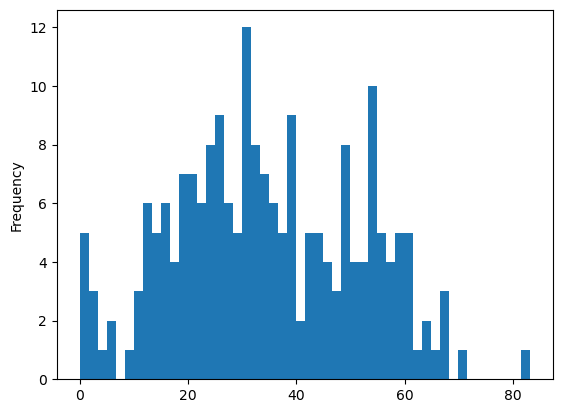

In [67]:
# A quick plot to see what the distribution of vehicle ownership is like:

va2['No Vehicle Available'].plot.hist(bins=50)

## Converting vehicle ownership into a geodata frame
Now it's time to bring in vehicle tract data to be able to map it. First I will bring in the data. Next, I will join the census tracts to vehicle ownership data using GEOID.

In [45]:
tracts=gpd.read_file('data/Census_Tracts_in_2020.geojson')

In [46]:
tracts.head()

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,P0010008,P0020002,P0020005,P0020006,P0020007,P0020008,P0020009,P0020010,P0030001,P0030003,P0030004,P0030005,P0030006,P0030007,P0030008,P0040002,P0040005,P0040006,P0040007,P0040008,P0040009,P0040010,H0010001,H0010002,H0010003,ALAND,AWATER,STUSAB,SUMLEV,GEOCODE,STATE,NAME,POP100,HU100,P0010009,P0010010,P0010011,P0010012,P0010013,P0010014,P0010015,P0010016,P0010017,P0010018,P0010019,P0010020,P0010021,P0010022,P0010023,P0010024,P0010025,P0010026,P0010027,P0010028,P0010029,P0010030,P0010031,P0010032,P0010033,P0010034,P0010035,P0010036,P0010037,P0010038,P0010039,P0010040,P0010041,P0010042,P0010043,P0010044,P0010045,P0010046,P0010047,P0010048,P0010049,P0010050,P0010051,P0010052,P0010053,P0010054,P0010055,P0010056,P0010057,P0010058,P0010059,P0010060,P0010061,P0010062,P0010063,P0010064,P0010065,P0010066,P0010067,P0010068,P0010069,P0010070,P0010071,P0020001,P0020003,P0020004,P0020011,P0020012,P0020013,P0020014,P0020015,P0020016,P0020017,P0020018,P0020019,P0020020,P0020021,P0020022,P0020023,P0020024,P0020025,P0020026,P0020027,P0020028,P0020029,P0020030,P0020031,P0020032,P0020033,P0020034,P0020035,P0020036,P0020037,P0020038,P0020039,P0020040,P0020041,P0020042,P0020043,P0020044,P0020045,P0020046,P0020047,P0020048,P0020049,P0020050,P0020051,P0020052,P0020053,P0020054,P0020055,P0020056,P0020057,P0020058,P0020059,P0020060,P0020061,P0020062,P0020063,P0020064,P0020065,P0020066,P0020067,P0020068,P0020069,P0020070,P0020071,P0020072,P0020073,P0030002,P0030009,P0030010,P0030011,P0030012,P0030013,P0030014,P0030015,P0030016,P0030017,P0030018,P0030019,P0030020,P0030021,P0030022,P0030023,P0030024,P0030025,P0030026,P0030027,P0030028,P0030029,P0030030,P0030031,P0030032,P0030033,P0030034,P0030035,P0030036,P0030037,P0030038,P0030039,P0030040,P0030041,P0030042,P0030043,P0030044,P0030045,P0030046,P0030047,P0030048,P0030049,P0030050,P0030051,P0030052,P0030053,P0030054,P0030055,P0030056,P0030057,P0030058,P0030059,P0030060,P0030061,P0030062,P0030063,P0030064,P0030065,P0030066,P0030067,P0030068,P0030069,P0030070,P0030071,P0040001,P0040003,P0040004,P0040011,P0040012,P0040013,P0040014,P0040015,P0040016,P0040017,P0040018,P0040019,P0040020,P0040021,P0040022,P0040023,P0040024,P0040025,P0040026,P0040027,P0040028,P0040029,P0040030,P0040031,P0040032,P0040033,P0040034,P0040035,P0040036,P0040037,P0040038,P0040039,P0040040,P0040041,P0040042,P0040043,P0040044,P0040045,P0040046,P0040047,P0040048,P0040049,P0040050,P0040051,P0040052,P0040053,P0040054,P0040055,P0040056,P0040057,P0040058,P0040059,P0040060,P0040061,P0040062,P0040063,P0040064,P0040065,P0040066,P0040067,P0040068,P0040069,P0040070,P0040071,P0040072,P0040073,P0050001,P0050002,P0050003,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,669,1022,1033,1722,4,83,0,21,3198,855,1505,24,71,0,470,701,805,1490,4,70,0,8,1532,1394,138,849376,0,DC,140,11001002002,11,Census Tract 20.02,4072,1532,425,392,61,33,38,0,183,15,13,4,38,0,0,0,1,4,2,32,19,1,0,2,0,0,7,0,1,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,4072,3050,2863,187,169,59,9,36,0,16,15,13,4,16,0,0,0,1,0,0,18,14,1,0,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2925,273,245,36,15,17,0,124,8,6,4,28,0,0,0,1,4,2,27,16,1,0,0,0,0,7,0,1,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,3198,2497,2377,120,105,36,5,17,0,16,8,6,4,12,0,0,0,1,0,0,15,11,1,0,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,32,0,0,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,1185,1868,885,2586,20,115,1,39,4375,827,2149,58,100,1,816,1277,731,2110,16,95,1,25,2335,2107,228,600992,0,DC,140,11001002101,11,Census Tract 21.01,5687,2335,616,572,42,11,37,0,339,30,19,0,68,0,0,23,2,1,0,41,10,4,0,4,1,0,17,0,4,0,0,0,0,0,0,1,0,0,0,0,3,1,0,1,0,0,0

<AxesSubplot: >

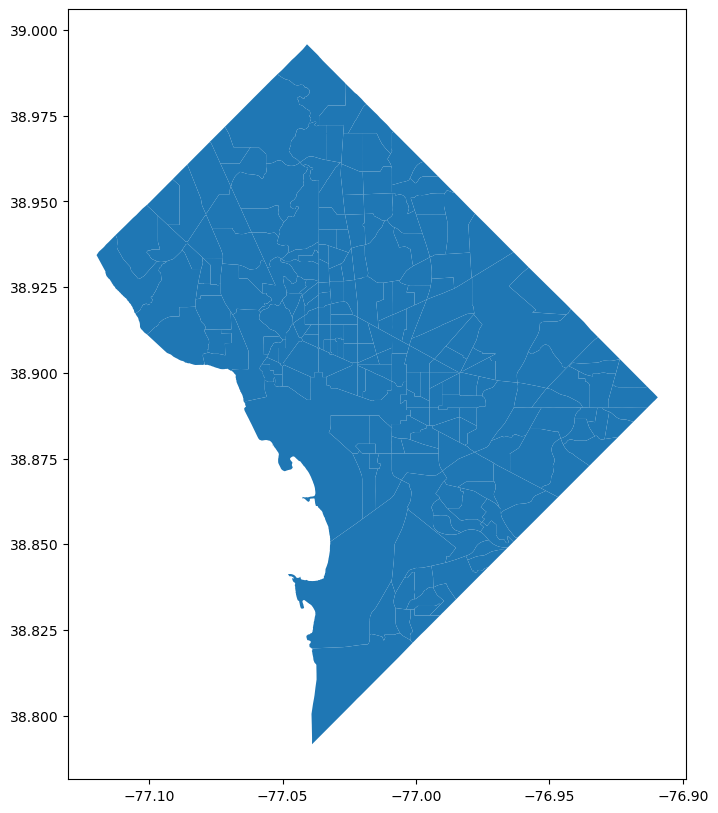

In [47]:
tracts.plot(figsize=(12,10))

In [48]:
# double checking the nature of the data
tracts.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 316 columns):
 #    Column     Non-Null Count  Dtype   
---   ------     --------------  -----   
 0    OBJECTID   206 non-null    int64   
 1    TRACT      206 non-null    object  
 2    GEOID      206 non-null    object  
 3    P0010001   206 non-null    int64   
 4    P0010002   206 non-null    int64   
 5    P0010003   206 non-null    int64   
 6    P0010004   206 non-null    int64   
 7    P0010005   206 non-null    int64   
 8    P0010006   206 non-null    int64   
 9    P0010007   206 non-null    int64   
 10   P0010008   206 non-null    int64   
 11   P0020002   206 non-null    int64   
 12   P0020005   206 non-null    int64   
 13   P0020006   206 non-null    int64   
 14   P0020007   206 non-null    int64   
 15   P0020008   206 non-null    int64   
 16   P0020009   206 non-null    int64   
 17   P0020010   206 non-null    int64   
 18   P0030001   206 non-null    int64   
 19 

Next, I will trim down the data to include only GEOID and geometry, which are the only two columns we will use.

In [49]:
tracts = tracts[['GEOID','geometry']]
tracts.head()

,GEOID,geometry
0,11001002002,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,11001002101,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,11001002102,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,11001002201,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,11001002202,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


Next, I will merge the vehicle access data along GEOID.

In [50]:
tracts_vehicle=tracts.merge(va2,on="GEOID")

In [51]:
tracts_vehicle.head()

,GEOID,geometry,No Vehicle Available,1 Vehicle Available,2 Vehicles Available,3 Vehicles Available,4 Vehicles Available,5 or More Vehicles Available
0,11001002002,"POLYGON ((-77.03642 38.94975, -77.03643 38.948...",12.02,50.00,27.09,6.91,1.00,2.99
1,11001002101,"POLYGON ((-77.02824 38.95813, -77.02824 38.958...",23.75,47.32,23.13,0.96,4.02,0.83
2,11001002102,"POLYGON ((-77.01997 38.95819, -77.01997 38.958...",23.18,44.99,31.16,0.66,0.00,0.00
3,11001002201,"POLYGON ((-77.02743 38.95188, -77.02740 38.951...",13.28,43.04,28.91,8.57,6.21,0.00
4,11001002202,"POLYGON ((-77.01968 38.95209, -77.01963 38.951...",23.20,44.73,12.80,19.27,0.00,0.00


Now that the data is merged, I want to add another column that combines together all the columns that indicate that a household has access to a vehicle.

In [52]:
vehicle_columns=['1 Vehicle Available',
'2 Vehicles Available',
'3 Vehicles Available',
'4 Vehicles Available',
'5 or More Vehicles Available']
tracts_vehicle['Any Vehicle'] = tracts_vehicle[vehicle_columns].sum(axis=1)

In [53]:
# let's see if it worked
tracts_vehicle.head()

,GEOID,geometry,No Vehicle Available,1 Vehicle Available,2 Vehicles Available,3 Vehicles Available,4 Vehicles Available,5 or More Vehicles Available,Any Vehicle
0,11001002002,"POLYGON ((-77.03642 38.94975, -77.03643 38.948...",12.02,50.00,27.09,6.91,1.00,2.99,87.99
1,11001002101,"POLYGON ((-77.02824 38.95813, -77.02824 38.958...",23.75,47.32,23.13,0.96,4.02,0.83,76.26
2,11001002102,"POLYGON ((-77.01997 38.95819, -77.01997 38.958...",23.18,44.99,31.16,0.66,0.00,0.00,76.81
3,11001002201,"POLYGON ((-77.02743 38.95188, -77.02740 38.951...",13.28,43.04,28.91,8.57,6.21,0.00,86.73
4,11001002202,"POLYGON ((-77.01968 38.95209, -77.01963 38.951...",23.20,44.73,12.80,19.27,0.00,0.00,76.80


# Output for Food and Vehicle Access Data

I will be producing a variety of charts and maps that represent food, vehicle access, and the intersection between the two variables. Ultimately, I will produce a map that overlays food access and vehicle access.

## Maps for Grocery Stores, Healthy Corner Stores, and Farmers Markets in Washington, D.C.

First, I wanted to make sure the X and Y coordinates are floats so they can be mapped.

In [54]:
all_stores.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215 entries, 0 to 61
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   X           215 non-null    float64
 1   Y           215 non-null    float64
 2   STORENAME   215 non-null    object 
 3   WARD        82 non-null     object 
 4   STORE TYPE  215 non-null    object 
dtypes: float64(2), object(3)
memory usage: 10.1+ KB


Next, I want to create a loop that adds markers to the different types of stores.

Now that they are confirmed to be mappable and a loop has been created, I want to start with a basic scatter map to get an idea of the location of different grocery stores. First, I'll do a scatter map using plotly with a dark matter theme.

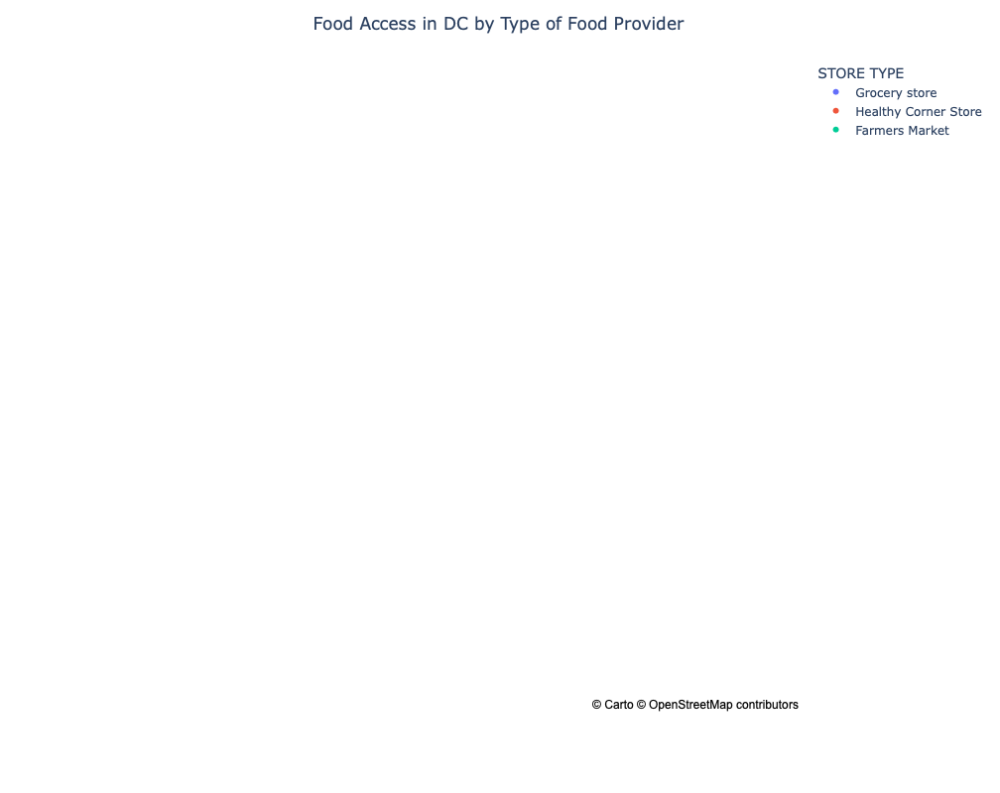

In [55]:
fig = px.scatter_mapbox(all_stores, 
                        lat="Y", 
                        lon="X", 
                        color="STORE TYPE",
                        labels={'STORE TYPE':'STORE TYPE'},
                        mapbox_style="carto-darkmatter"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Food Access in DC by Type of Food Provider",
    title_x=0.5 
)


fig.show()

I think changing the map style may make it easier to distinguish between particular neighborhoods.

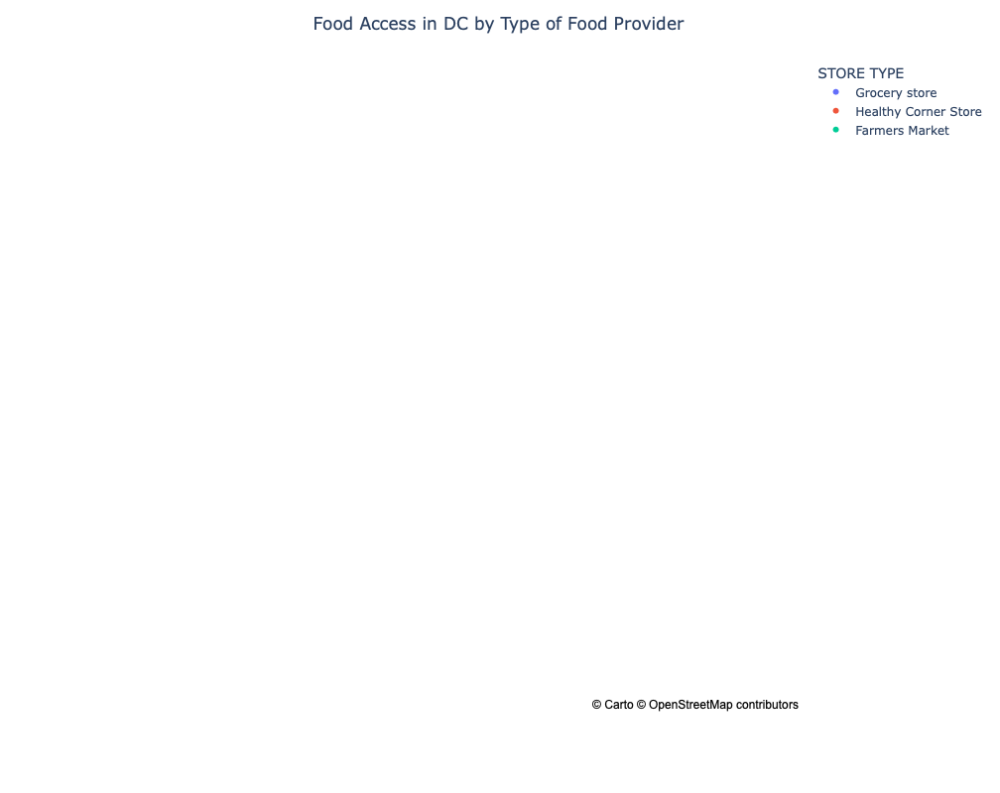

In [56]:
fig = px.scatter_mapbox(all_stores, 
                        lat="Y", 
                        lon="X", 
                        color="STORE TYPE",
                        labels={'STORE TYPE':'STORE TYPE'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Food Access in DC by Type of Food Provider",
    title_x=0.5 
)


fig.show()

I'm noticing that areas in the Southeast portino of the DC map have fewer grocery stores, and there are gaps in the Northeast and very north of the map. Interetingly, th greatest cluster is around downtown DC and to the Northeast portion of the city.

## Mapping Vehicle Access by DC Census Tract

Next, I want to use folium to generate a cholorpleth map that displays vehicle ownership by census tract.

First, I want to check the projection of the vehicle access data.

In [57]:
tracts_vehicle.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now, I can go ahead and use a base a map that corresponds to this CRS with MapPlotLib.

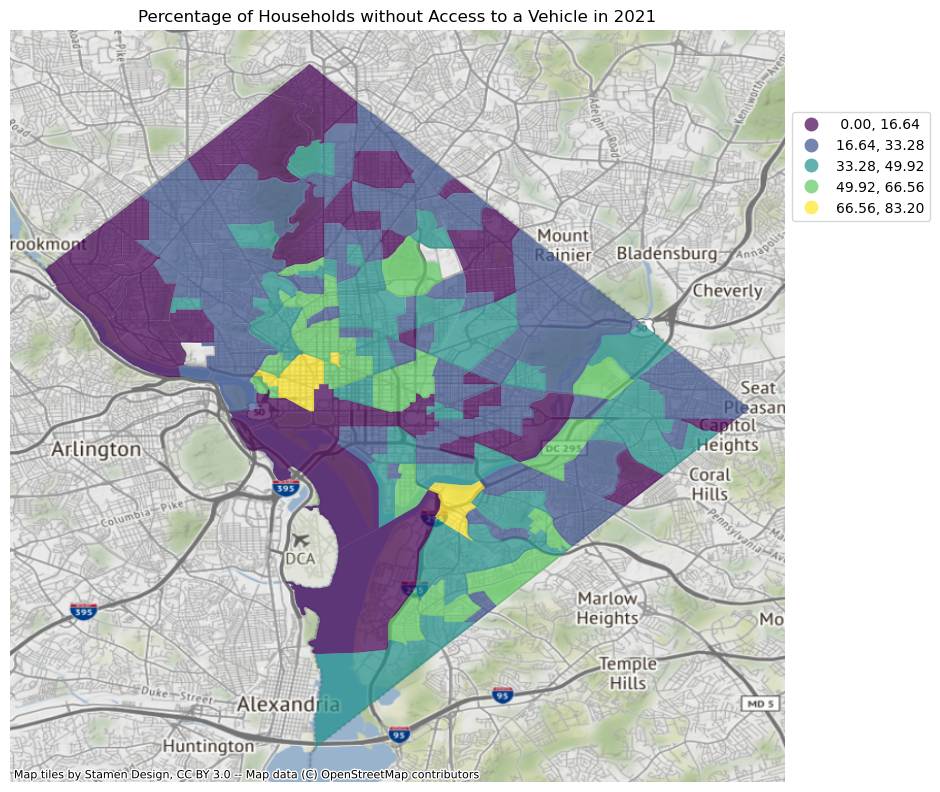

In [58]:
fig, ax = plt.subplots(figsize=(10,10))

tracts_vehicle.plot(figsize=(12,10), 
                 column='No Vehicle Available',
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)

ax.set_title('Percent Black Population in Washington, D.C. Census Tracts')

ax.axis('off')

ax.set_title('Percentage of Households without Access to a Vehicle in 2021')

ctx.add_basemap(ax, crs=4326)

I'll make the inverse map, percentage of households with Vehicle Access, to see if it looks better.

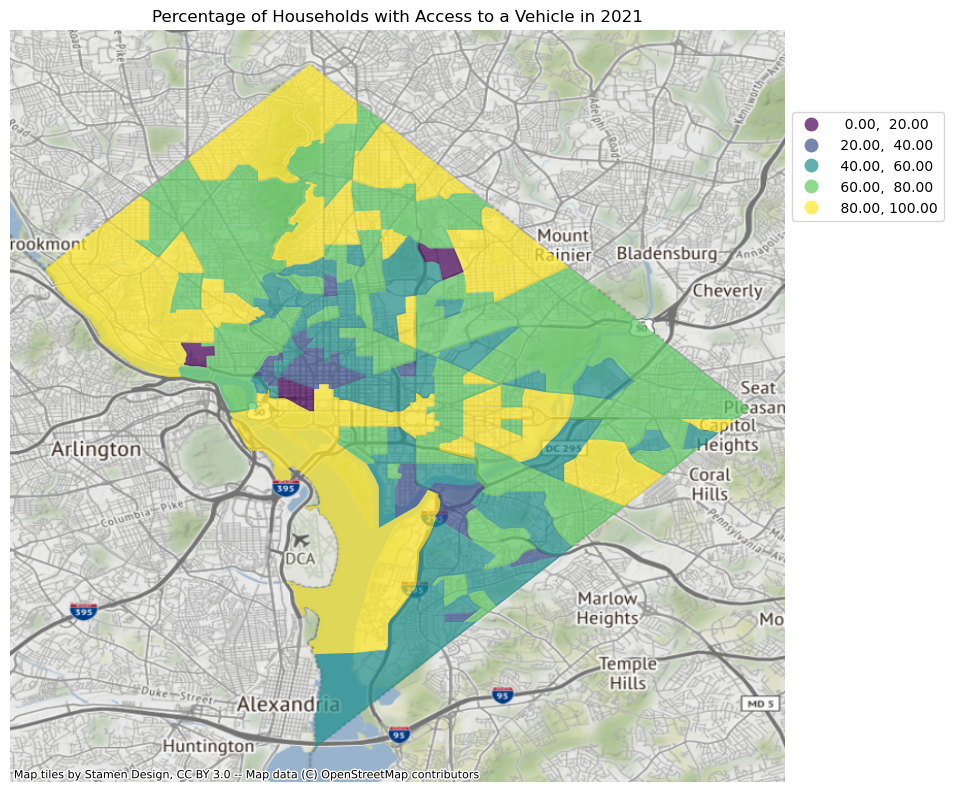

In [59]:
fig, ax = plt.subplots(figsize=(10,10))

tracts_vehicle.plot(figsize=(12,10), 
                 column='Any Vehicle',
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)

ax.set_title('Percent Black Population in Washington, D.C. Census Tracts')

ax.axis('off')

ax.set_title('Percentage of Households with Access to a Vehicle in 2021')

ctx.add_basemap(ax, crs=4326)

Now, I want to make this map interactive so I will use Folium.

In [60]:
# First, I'll bring in a base map
m = folium.Map(location=[38.9,-77.00], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [61]:
m = folium.Map(location=[38.9,-77.00], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_vehicle, # geo data
                  data=tracts_vehicle, # data          
                  key_on='feature.properties.GEOID', # key, or merge column
                  columns=['GEOID', 'No Vehicle Available'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='% with No Vehicle Ownership').add_to(m)    # name on the legend color bar
m

In [62]:
m = folium.Map(location=[38.9,-77.00], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_vehicle, # geo data
                  data=tracts_vehicle, # data          
                  key_on='feature.properties.GEOID', # key, or merge column
                  columns=['GEOID', 'Any Vehicle'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='% of Households with Vehicle Access').add_to(m)    
m

I like this map the best because it feels a little easier to read than the map without vehicle ownership.

## Mapping Food Access onto Vehicle Access

Now, to bring everything together, I want to add the grocery stores, healthy corner stores, and farmers markets onto this map of vehicle access.

To start with, I want to create a loop that creates markers for each type of food provicer.

In [63]:
for index, row in grocery_trimmed.iterrows():
    folium.Marker([row.Y, row.X], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='white',icon_color='black')).add_to(m)
for index, row in healthy_trimmed.iterrows():
    folium.Marker([row.Y, row.X], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='black')).add_to(m)
m

In [64]:
# create a legend
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:white;opacity:0.7;'></span>Grocery Stores</li>
    <li><span style='background:Black;opacity:0.7;'></span>Healthy Corner Stores</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

m

In this map, we would expect any areas with few grocery stores to compensate for it with higher rates of vehicle access. This does seem to be occurring in the Northwest where the lack of grocery stores and healthy corner stores is balanced by high vehicle access. In the northeast, there seems to be some areas with a deficit of both car access and food access. In the Southeast, areas with low levels of vehicle ownership seem to have the void filled by healthy corner stores more so than grocery stores.